**LEVEL 1**

**TASK 1**:

Task: Data Exploration and Preprocessing

In [17]:
#Libraries Importation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')




In [18]:
#Loading the Dataset
cognifyz_data=pd.read_csv('/content/Dataset .csv')
cognifyz_data.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


Q.1 Explore the dataset and identify the number
of rows and columns

In [3]:
#check on the number of rows and columns
cognifyz_data.shape


(9551, 21)

This Dataset contains 9551 Rows and 21 columns

**Data Cleaning**

Q.2 Check for missing values in each column and
handle them accordingly.

In [4]:
#check on the missing values in our dataset
cognifyz_data.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

The Cusines column has 9 missing values. We need to replace the missing values with "Uknown" since there are only 9 enries missing

In [21]:
# Replace missing values in 'Cuisines' with 'Unknown'
cognifyz_data['Cuisines'].fillna('Unknown', inplace=True)


In [22]:
#now check on the missing values in our dataset
cognifyz_data.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                0
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

After carefully checking on our data We find that our dataset does not have any missing values

Q3. Perform data type conversion if necessary.
Analyze the distribution of the target variable
("Aggregate rating") and identify any class
imbalances.


In [23]:
#cheking on the datatypes and correct the format if available\
cognifyz_data.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

For columns Has Table booking', Has Online delivery, Is delivering now, and Switch to order menu,  these are binary or categorical indicators (i.e., 'Yes'/'No'), we consider converting these to boolean (bool) for better clarity and efficiency. This would require conversion as shown below:

In [46]:
cognifyz_data['Has Table booking'] = cognifyz_data['Has Table booking'].map({'Yes': True, 'No': False})
cognifyz_data['Has Online delivery'] = cognifyz_data['Has Online delivery'].map({'Yes': True, 'No': False})
cognifyz_data['Is delivering now'] = cognifyz_data['Is delivering now'].map({'Yes': True, 'No': False})
cognifyz_data['Switch to order menu'] = cognifyz_data['Switch to order menu'].map({'Yes': True, 'No': False})


In [47]:
# Check for missing values in each column
missing_values = cognifyz_data.isna().sum()
print(missing_values)


Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
City_encoded            0
dtype: int64


In [48]:
# Check data types
print(cognifyz_data.dtypes)


Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking          bool
Has Online delivery        bool
Is delivering now          bool
Switch to order menu       bool
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
City_encoded              int16
dtype: object


We have succesfully converted the above mentioned columns to Boolean

In [27]:
# Check for out-of-range values or anomalies
print(cognifyz_data['Longitude'].describe())
print(cognifyz_data['Latitude'].describe())
print(cognifyz_data['Average Cost for two'].describe())
print(cognifyz_data['Votes'].describe())


count    9551.000000
mean       64.126574
std        41.467058
min      -157.948486
25%        77.081343
50%        77.191964
75%        77.282006
max       174.832089
Name: Longitude, dtype: float64
count    9551.000000
mean       25.854381
std        11.007935
min       -41.330428
25%        28.478713
50%        28.570469
75%        28.642758
max        55.976980
Name: Latitude, dtype: float64
count      9551.000000
mean       1199.210763
std       16121.183073
min           0.000000
25%         250.000000
50%         400.000000
75%         700.000000
max      800000.000000
Name: Average Cost for two, dtype: float64
count     9551.000000
mean       156.909748
std        430.169145
min          0.000000
25%          5.000000
50%         31.000000
75%        131.000000
max      10934.000000
Name: Votes, dtype: float64


In [28]:
# Check unique values in categorical columns
print(cognifyz_data['Has Table booking'].unique())
print(cognifyz_data['Has Online delivery'].unique())
print(cognifyz_data['Is delivering now'].unique())
print(cognifyz_data['Switch to order menu'].unique())


[ True False]
[False  True]
[False  True]
[False]


**Has Table booking:** Contains both True and False, which is expected if the column represents whether a table booking is available.

**Has Online delivery:** Contains both False and True, which is expected if some restaurants offer online delivery while others do not.

**Is delivering now:** Contains both False and True, which is expected if some restaurants are currently delivering.

**Switch to order menu:** Contains only False.

We can now confidently say the dataset is clean and ready for further analysis

**TASK 2**

Task: Descriptive Analysis


Q.1 Calculate basic statistical measures (mean,
median, standard deviation, etc.) for numerical
columns.

In [29]:
# calculating statistical measures
cognifyz_data.describe()


,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


Q.2 Explore the distribution of categorical
variables like "Country Code", "City, and
"Cuisines".

Identify the top cuisines and cities with the
highest number of restaurants

# Determine Country Code Distribution

In [34]:
# Distribution of "Country Code"
country_distribution = cognifyz_data['Country Code'].value_counts()
print("Country Code Distribution:\n", country_distribution)


Country Code Distribution:
 Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64


#City Distribution

In [35]:
 #Distribution of "City"
city_distribution = cognifyz_data['City'].value_counts()
print("City Distribution:\n", city_distribution)


City Distribution:
 City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64


#Cuisines Distribution

In [36]:
# Distribution of "Cuisines"
cuisines_distribution = cognifyz_data['Cuisines'].value_counts()
print("Cuisines Distribution:\n", cuisines_distribution)


Cuisines Distribution:
 Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1826, dtype: int64


In [37]:



# Identify the top cuisines with the highest number of restaurants
top_cuisines = cuisines_distribution.head(10)
print("Top 10 Cuisines with the highest number of restaurants:\n", top_cuisines)



Top 10 Cuisines with the highest number of restaurants:
 Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [38]:
# Identify the top cities with the highest number of restaurants
top_cities = city_distribution.head(10)
print("Top 10 Cities with the highest number of restaurants:\n", top_cities)



Top 10 Cities with the highest number of restaurants:
 City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


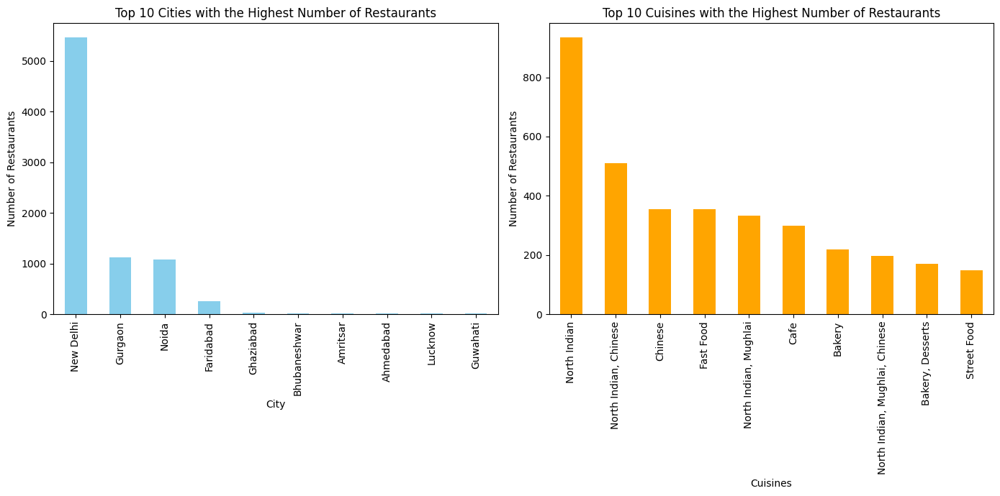

In [39]:
# Plotting the distributions
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
top_cities.plot(kind='bar', color='skyblue')
plt.title('Top 10 Cities with the Highest Number of Restaurants')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')

plt.subplot(1, 2, 2)
top_cuisines.plot(kind='bar', color='orange')
plt.title('Top 10 Cuisines with the Highest Number of Restaurants')
plt.xlabel('Cuisines')
plt.ylabel('Number of Restaurants')

plt.tight_layout()
plt.show()


**TASK 3**

Task: Geospatial Analysis


Q.1 Visualize the locations of restaurants on a
map using latitude and longitude
information.

In [40]:
# this code visualize the locations of restaurants on a map
import folium
from folium.plugins import MarkerCluster

# Load the dataset
cognifyz_data = pd.read_csv('/content/Dataset .csv')

# Create a base map
map_center = [cognifyz_data['Latitude'].mean(), cognifyz_data['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

# Add a marker cluster to the map
marker_cluster = MarkerCluster().add_to(restaurant_map)

# Add markers to the marker cluster
for idx, row in cognifyz_data.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=row['Restaurant Name'],
                  icon=folium.Icon(color='blue', icon='cutlery', prefix='fa')
                 ).add_to(marker_cluster)

# Display the map
restaurant_map


The above code  generate an interactive map showing the locations of the restaurants as shown above.

Q2. Analyze the distribution of restaurants
across different cities or countries.
Determine if there is any correlation
between the restaurant's location and its
rating

#Distribution of Restaurants Across Different Cities and Countries

In [41]:
# Distribution of restaurants by Country Code
country_distribution = cognifyz_data['Country Code'].value_counts()
print("Distribution of Restaurants by Country Code:\n", country_distribution)

# Distribution of restaurants by City
city_distribution = cognifyz_data['City'].value_counts()
print("Distribution of Restaurants by City:\n", city_distribution)


Distribution of Restaurants by Country Code:
 Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64
Distribution of Restaurants by City:
 City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64


#Average Rating for Restaurants in Different Cities and Countries

In [42]:
# Average rating by Country Code
average_rating_country = cognifyz_data.groupby('Country Code')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Rating by Country Code:\n", average_rating_country)

# Average rating by City
average_rating_city = cognifyz_data.groupby('City')['Aggregate rating'].mean().sort_values(ascending=False)
print("Average Rating by City:\n", average_rating_city)


Average Rating by Country Code:
 Country Code
162    4.468182
208    4.300000
94     4.295238
148    4.262500
214    4.233333
189    4.210000
215    4.087500
166    4.060000
216    4.004378
191    3.870000
30     3.763333
14     3.658333
37     3.575000
184    3.575000
1      2.523324
Name: Aggregate rating, dtype: float64
Average Rating by City:
 City
Inner City          4.900000
Quezon City         4.800000
Makati City         4.650000
Pasig City          4.633333
Mandaluyong City    4.625000
                      ...   
New Delhi           2.438845
Montville           2.400000
Mc Millan           2.400000
Noida               2.036204
Faridabad           1.866932
Name: Aggregate rating, Length: 141, dtype: float64


#Correlation Between Location and Rating

In [43]:
# Correlation between Country Code and Aggregate rating
country_code_rating_correlation = cognifyz_data[['Country Code', 'Aggregate rating']].corr()
print("Correlation between Country Code and Rating:\n", country_code_rating_correlation)

# Correlation between City and Aggregate rating (encoding city names to numeric values for correlation)
cognifyz_data['City_encoded'] = cognifyz_data['City'].astype('category').cat.codes
city_rating_correlation = cognifyz_data[['City_encoded', 'Aggregate rating']].corr()
print("Correlation between City and Rating:\n", city_rating_correlation)


Correlation between Country Code and Rating:
                   Country Code  Aggregate rating
Country Code          1.000000          0.282189
Aggregate rating      0.282189          1.000000
Correlation between City and Rating:
                   City_encoded  Aggregate rating
City_encoded          1.000000         -0.132163
Aggregate rating     -0.132163          1.000000


#Visualizing the Distribution and Correlation

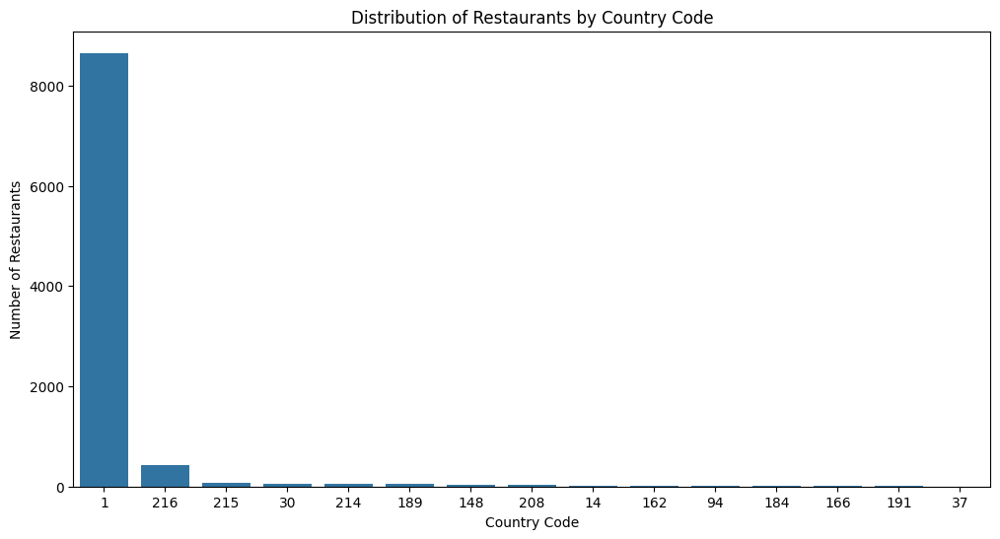

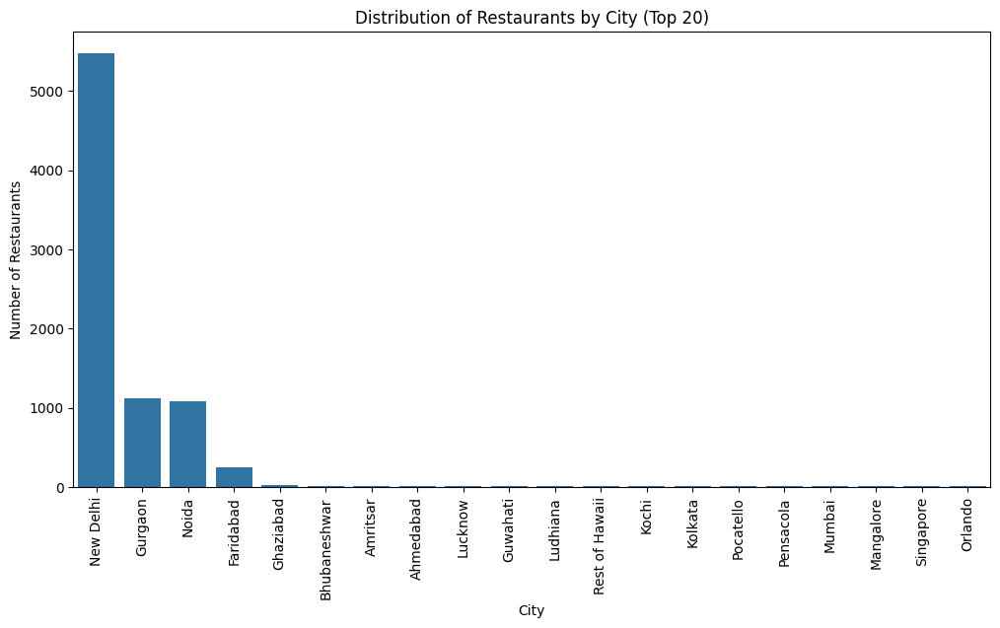

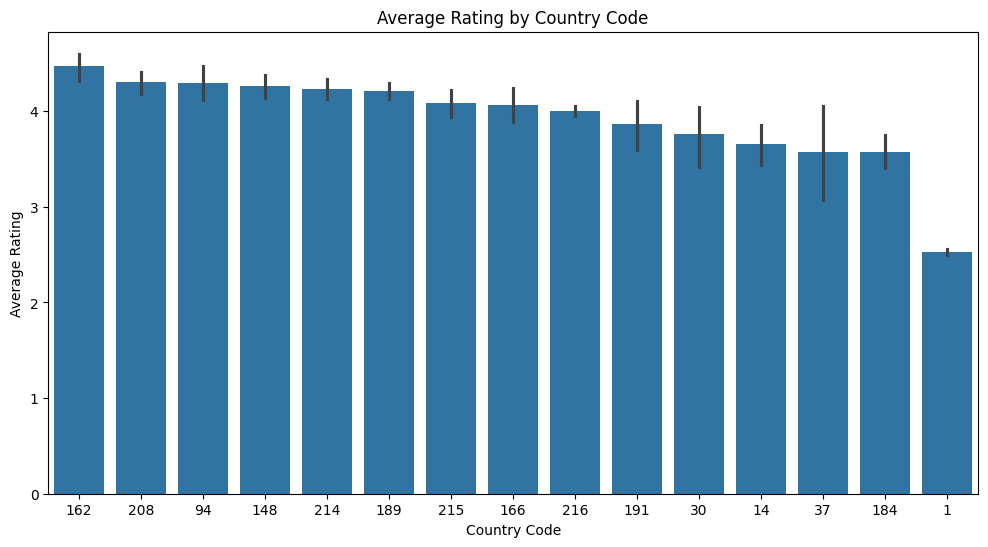

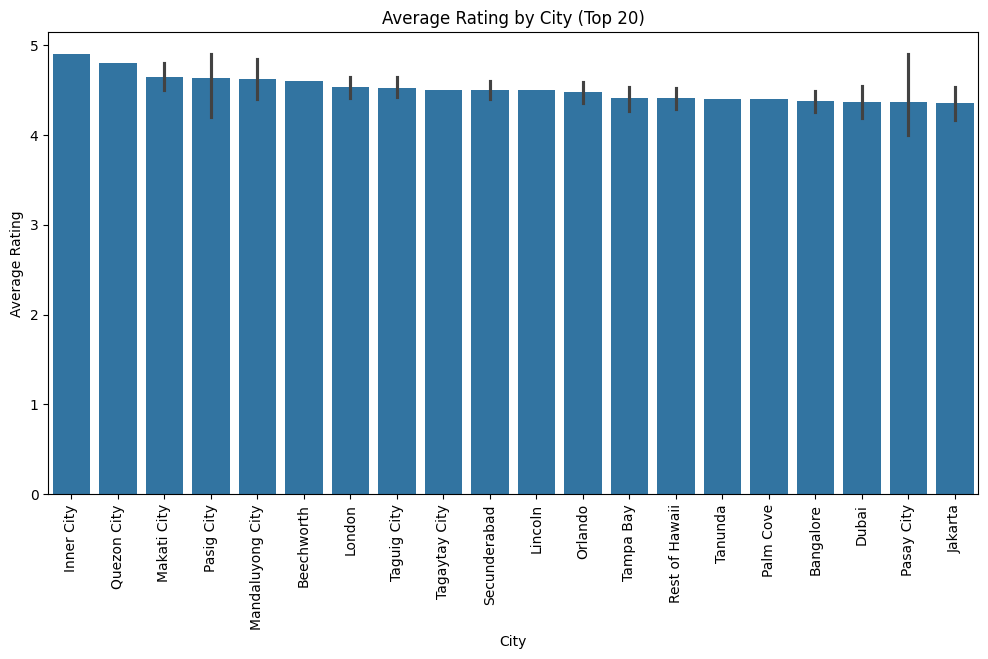

In [44]:
# Visualize the distribution of restaurants by Country Code
plt.figure(figsize=(12, 6))
sns.countplot(data=cognifyz_data, x='Country Code', order=country_distribution.index)
plt.title('Distribution of Restaurants by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.show()

# Visualize the distribution of restaurants by City (top 20 cities)
plt.figure(figsize=(12, 6))
top_20_cities = city_distribution.head(20).index
sns.countplot(data=cognifyz_data[cognifyz_data['City'].isin(top_20_cities)], x='City', order=top_20_cities)
plt.title('Distribution of Restaurants by City (Top 20)')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.xticks(rotation=90)
plt.show()

# Visualize the average rating by Country Code
plt.figure(figsize=(12, 6))
sns.barplot(data=cognifyz_data, x='Country Code', y='Aggregate rating', estimator='mean', order=average_rating_country.index)
plt.title('Average Rating by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Average Rating')
plt.show()

# Visualize the average rating by City (top 20 cities)
plt.figure(figsize=(12, 6))
top_20_avg_cities = average_rating_city.head(20).index
sns.barplot(data=cognifyz_data[cognifyz_data['City'].isin(top_20_avg_cities)], x='City', y='Aggregate rating', estimator='mean', order=top_20_avg_cities)
plt.title('Average Rating by City (Top 20)')
plt.xlabel('City')
plt.ylabel('Average Rating')
plt.xticks(rotation=90)
plt.show()


This comprehensive analysis includes:

Calculating and displaying the distribution of restaurants by country and city.

Calculating and displaying the average rating by country and city.

Calculating and displaying the correlation between country/city and rating.

Visualizing the distribution and average ratings with bar plots.

**LEVEL 2**


**TASK 1**
Task: Table Booking and Online Delivery

Q.1 Determine the percentage of restaurants that
offer table booking and online delivery.

In [49]:
# Calculate the percentage of restaurants that offer table booking
total_restaurants = len(cognifyz_data)
table_booking_count = cognifyz_data['Has Table booking'].sum()
table_booking_percentage = (table_booking_count / total_restaurants) * 100

# Calculate the percentage of restaurants that offer online delivery
online_delivery_count = cognifyz_data['Has Online delivery'].sum()
online_delivery_percentage = (online_delivery_count / total_restaurants) * 100

print(f"Percentage of restaurants that offer table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants that offer online delivery: {online_delivery_percentage:.2f}%")


Percentage of restaurants that offer table booking: 12.12%
Percentage of restaurants that offer online delivery: 25.66%


Q.2 Compare the average ratings of restaurants
with table booking and those without.

In [50]:
# Calculate the average rating for restaurants with table booking
average_rating_with_booking = cognifyz_data[cognifyz_data['Has Table booking']]['Aggregate rating'].mean()

# Calculate the average rating for restaurants without table booking
average_rating_without_booking = cognifyz_data[~cognifyz_data['Has Table booking']]['Aggregate rating'].mean()

print(f"Average rating for restaurants with table booking: {average_rating_with_booking:.2f}")
print(f"Average rating for restaurants without table booking: {average_rating_without_booking:.2f}")

Average rating for restaurants with table booking: 3.44
Average rating for restaurants without table booking: 2.56


 this code will gives us the average ratings for restaurants with and without table booking, allowing you to compare them

Q3. Analyze the availability of online delivery
among restaurants with different price ranges.

Percentage of Restaurants Offering Online Delivery by Price Range:
Price range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
Name: Has Online delivery, dtype: float64


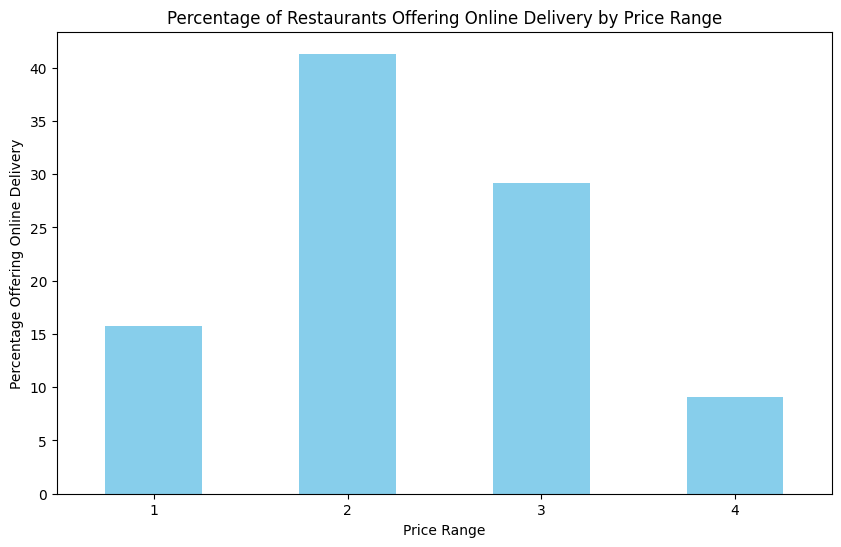

In [51]:
# Group by 'Price range' and calculate the percentage of restaurants that offer online delivery
online_delivery_by_price_range = cognifyz_data.groupby('Price range')['Has Online delivery'].mean() * 100

print("Percentage of Restaurants Offering Online Delivery by Price Range:")
print(online_delivery_by_price_range)

# Visualize the availability of online delivery across different price ranges
plt.figure(figsize=(10, 6))
online_delivery_by_price_range.plot(kind='bar', color='skyblue')
plt.title('Percentage of Restaurants Offering Online Delivery by Price Range')
plt.xlabel('Price Range')
plt.ylabel('Percentage Offering Online Delivery')
plt.xticks(rotation=0)
plt.show()

this code provide  the percentage of restaurants offering online delivery for each price range and a visual representation of the results.